<a href="https://colab.research.google.com/github/WP2-ahmadalwifathurohman17200659/Final-Project-Home-Credit/blob/main/Final_Project_Home_Credit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

import


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import warnings



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Load the datasets from the specified folder in MyDrive
base_path = '/content/drive/MyDrive/home-credit-default-risk/'
application_test_df = pd.read_csv(base_path + 'application_test.csv')
application_train_df = pd.read_csv(base_path + 'application_train.csv')
bureau_df = pd.read_csv(base_path + 'bureau.csv')
bureau_balance_df = pd.read_csv(base_path + 'bureau_balance.csv')
installments_payments_df = pd.read_csv(base_path + 'installments_payments.csv')
previous_application_df = pd.read_csv(base_path + 'previous_application.csv')
sample_submission_df = pd.read_csv(base_path + 'sample_submission.csv')



# Display the first few rows of each DataFrame to verify loading
print("application_test.csv:")
display(application_test_df.head())

print("\napplication_train.csv:")
display(application_train_df.head())

print("\nbureau.csv:")
display(bureau_df.head())

print("\nbureau_balance.csv:")
display(bureau_balance_df.head())

print("\ninstallments_payments.csv:")
display(installments_payments_df.head())

print("\nprevious_application.csv:")
display(previous_application_df.head())

print("\nsample_submission.csv:")
display(sample_submission_df.head())


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
application_test.csv:


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN



application_train.csv:


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0



bureau.csv:


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN



bureau_balance.csv:


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C



installments_payments.csv:


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585



previous_application.csv:


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN



sample_submission.csv:


,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5
2,100013,0.5
3,100028,0.5
4,100038,0.5


explore data


In [ ]:
application_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [ ]:
application_train_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
application_train_df.isnull().sum()

,0
SK_ID_CURR,0
TARGET,0
NAME_CONTRACT_TYPE,0
CODE_GENDER,0
FLAG_OWN_CAR,0
...,...
AMT_REQ_CREDIT_BUREAU_DAY,41519
AMT_REQ_CREDIT_BUREAU_WEEK,41519
AMT_REQ_CREDIT_BUREAU_MON,41519
AMT_REQ_CREDIT_BUREAU_QRT,41519


In [ ]:
application_train_df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [ ]:
pd.options.display.max_rows = None
print('Feature Name                 Sum Null\n')
print([application_train_df.isnull().sum().sum() >0])

Feature Name                 Sum Null

[np.True_]


In [ ]:
application_train_df.duplicated().sum()

np.int64(0)

In [ ]:
len(application_train_df)

307511

missing value

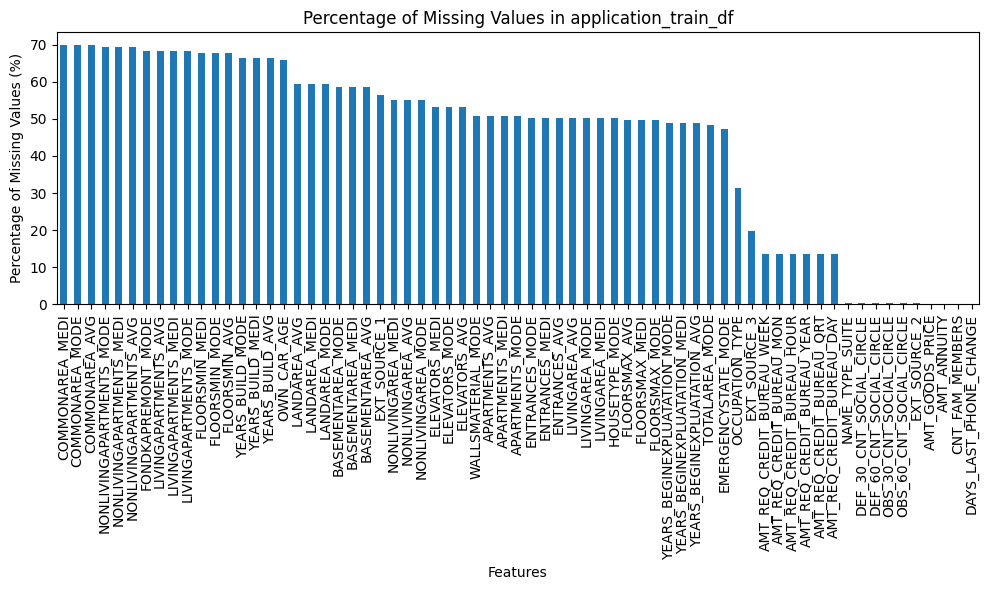

In [ ]:
# Calculate missing values
missing_values = application_train_df.isnull().sum()

# Calculate percentage of missing values
missing_values_percentage = (missing_values / len(application_train_df)) * 100

# Filter columns with missing values and sort
missing_values_percentage = missing_values_percentage[missing_values_percentage > 0].sort_values(ascending=False)

# Plot missing values
plt.figure(figsize=(10, 6))
missing_values_percentage.plot(kind='bar')
plt.title('Percentage of Missing Values in application_train_df')
plt.xlabel('Features')
plt.ylabel('Percentage of Missing Values (%)')
plt.tight_layout()
plt.show()

In [ ]:
len(application_train_df.columns)

122

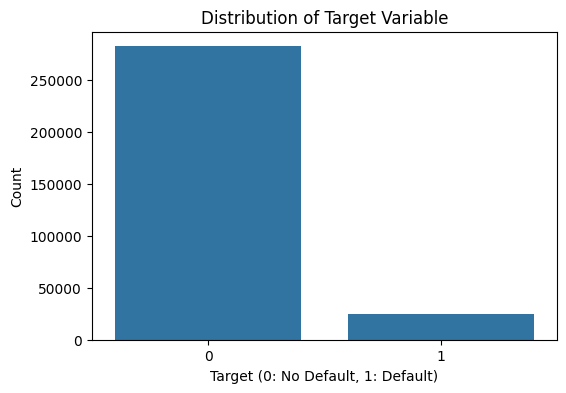

Target Distribution:
TARGET
0    282686
1     24825
Name: count, dtype: int64


In [ ]:
# Get the count of each target value
target_counts = application_train_df['TARGET'].value_counts()

# Plot the distribution of the target variable
plt.figure(figsize=(6, 4))
sns.barplot(x=target_counts.index, y=target_counts.values)
plt.title('Distribution of Target Variable')
plt.xlabel('Target (0: No Default, 1: Default)')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['0', '1']) # Ensure ticks are at 0 and 1
plt.show()

print("Target Distribution:")
print(target_counts)

data visualizion

In [ ]:
# app_target = application_train_df.pop('TARGET') # Removed: 'TARGET' column was already popped

print(f"x shape : {application_train_df.shape}")
print(f"y shape : {application_train_df.shape}")

x shape : (307511, 121)
y shape : (307511, 121)


In [ ]:
import pandas as pd

# Load the datasets from the specified folder in MyDrive
base_path = '/content/drive/MyDrive/home-credit-default-risk/'
application_train_df = pd.read_csv(base_path + 'application_train.csv')

application_train_df_copy = application_train_df.copy()

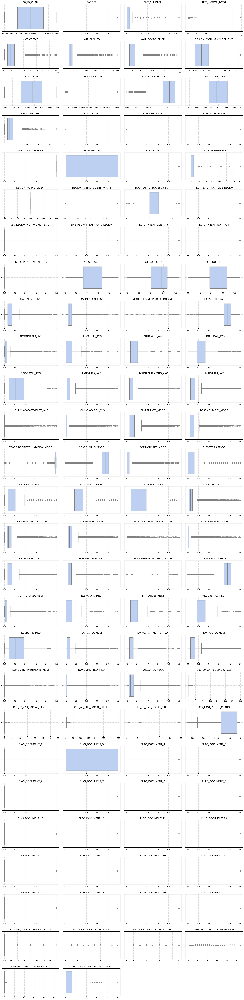

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import math # Import math for ceil

# Load the datasets from the specified folder in MyDrive (from cell a5y9F88GuzF9)
base_path = '/content/drive/MyDrive/home-credit-default-risk/'
application_train_df = pd.read_csv(base_path + 'application_train.csv')
application_train_df_copy = application_train_df.copy()

# Define numeric and category variables (from cell JLwkvZ1yws7v)
numeric = application_train_df_copy.select_dtypes(include= 'number').columns
category = application_train_df_copy.select_dtypes(include= 'object').columns

# Calculate the number of rows needed for the subplots (assuming 4 columns)
n_cols = 4
n_rows = math.ceil(len(numeric) / n_cols)

plt.figure(figsize=(20, n_rows * 3)) # Adjust figure size based on number of rows
for i in range(len(numeric)):
  plt.subplot(n_rows, n_cols, i + 1) # Use 3 arguments for subplot: nrows, ncols, index
  sns.boxplot(x=application_train_df_copy[numeric[i]], color=sns.color_palette("coolwarm", 10)[3]) #warna lebih menarik
  plt.title(numeric[i], fontsize=14)
  plt.xlabel('')
  plt.grid(True, linestyle="--", alpha=0.5) #tambahkan grid agar lebih jelas

plt.tight_layout()
plt.show()

In [ ]:
application_train_df[category].nunique()

,0
NAME_CONTRACT_TYPE,2
CODE_GENDER,3
FLAG_OWN_CAR,2
FLAG_OWN_REALTY,2
NAME_TYPE_SUITE,7
NAME_INCOME_TYPE,8
NAME_EDUCATION_TYPE,5
NAME_FAMILY_STATUS,6
NAME_HOUSING_TYPE,6
OCCUPATION_TYPE,18


In [ ]:
df_cat_anl = application_train_df[category].drop(columns=['OCCUPATION_TYPE', 'ORGANIZATION_TYPE'])

In [ ]:
len(df_cat_anl.columns)

14

Korelasi Fitur Numerik dengan TARGET:


,0
TARGET,1.000000
DAYS_BIRTH,0.078239
REGION_RATING_CLIENT_W_CITY,0.060893
REGION_RATING_CLIENT,0.058899
DAYS_LAST_PHONE_CHANGE,0.055218
...,...
FLOORSMAX_AVG,-0.044003
DAYS_EMPLOYED,-0.044932
EXT_SOURCE_1,-0.155317
EXT_SOURCE_2,-0.160472


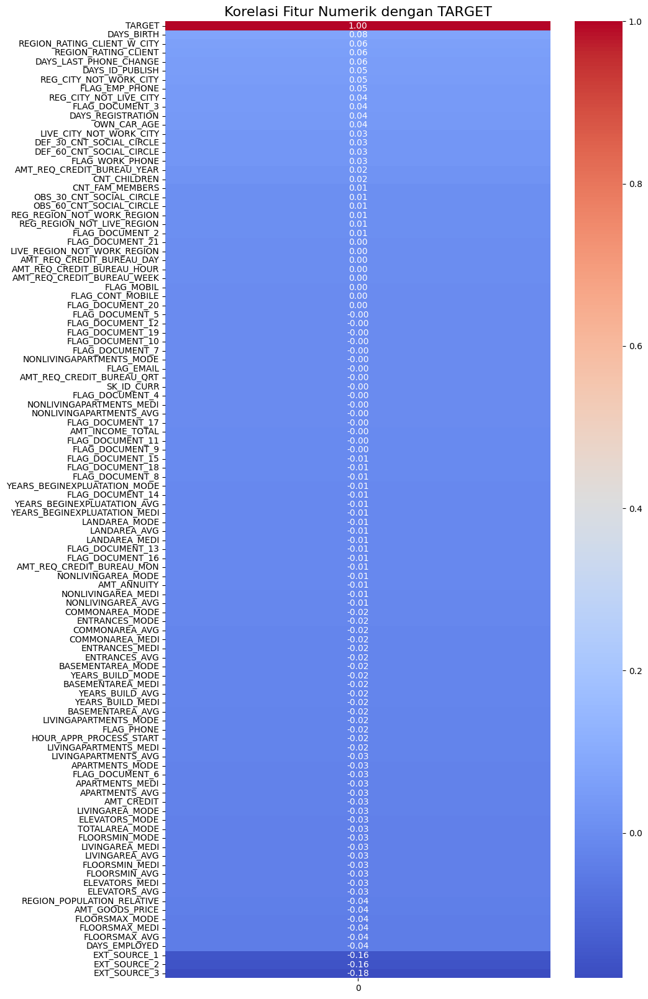

In [ ]:
# Calculate the correlation matrix
correlation_matrix = application_train_df_copy[numeric].corrwith(application_train_df_copy['TARGET'])

# Sort the correlations
sorted_correlations = correlation_matrix.sort_values(ascending=False)

# Display the sorted correlations
print("Korelasi Fitur Numerik dengan TARGET:")
display(sorted_correlations)

# Optional: Visualize the correlations using a heatmap
plt.figure(figsize=(10, 20))
sns.heatmap(sorted_correlations.to_frame(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Korelasi Fitur Numerik dengan TARGET', fontsize=16)
plt.show()

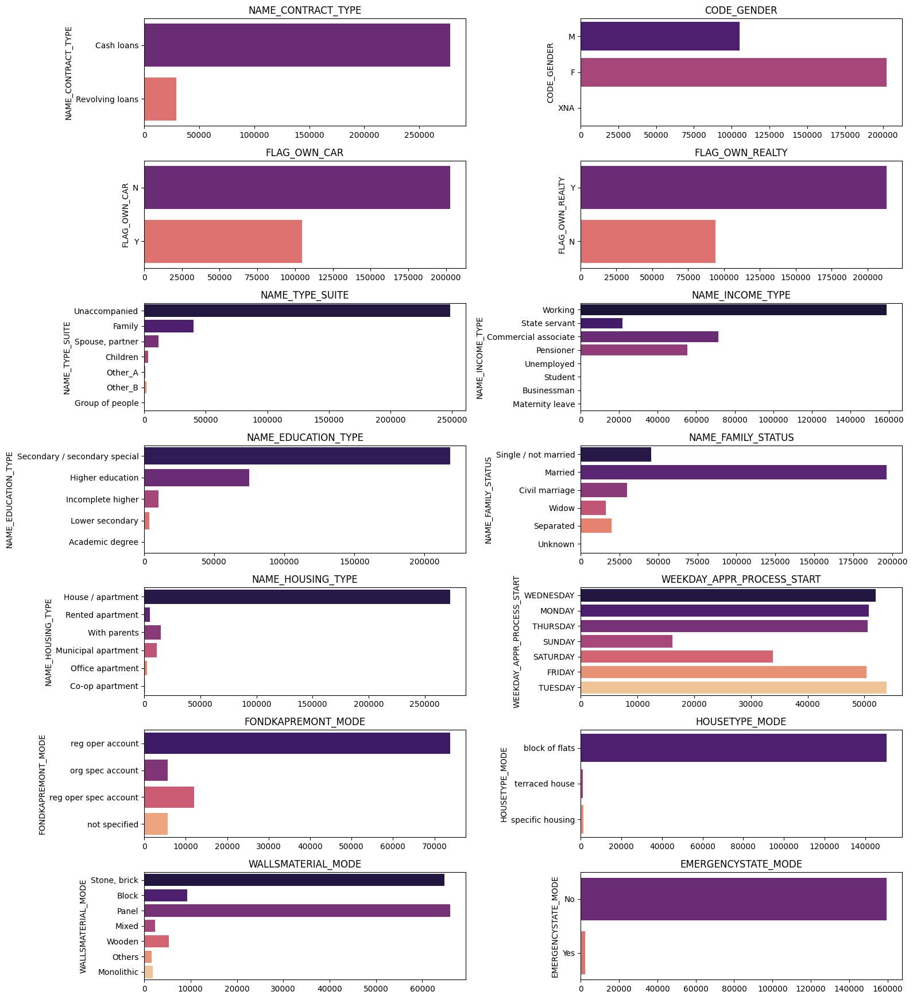

In [ ]:
import warnings
import math
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings(action= 'ignore', category=FutureWarning)
n_cols = 2
n_rows = math.ceil(len (df_cat_anl.columns) / n_cols)

plt.figure(figsize=(16, n_rows * 2.5))
for i, col in enumerate(df_cat_anl.columns):
  plt.subplot(n_rows, n_cols, i + 1)
  sns.countplot(y=df_cat_anl[col], palette= 'magma')
  plt.title(col)
  plt.xlabel('')
  plt.tight_layout()

plt.show()

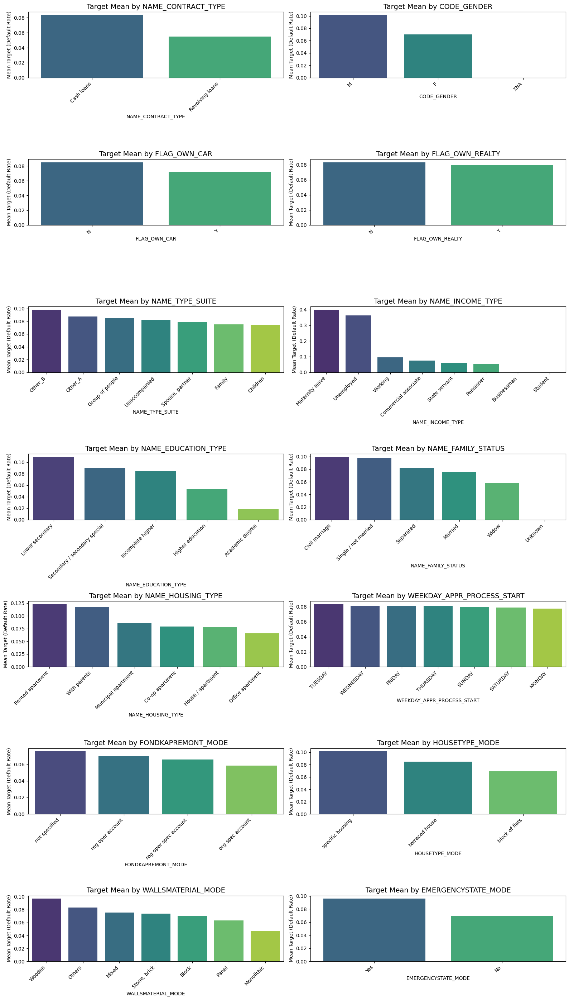

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Analyze the relationship between categorical features and the target
n_cols = 2
n_rows = math.ceil(len(df_cat_anl.columns) / n_cols)

plt.figure(figsize=(16, n_rows * 4)) # Adjust figure size

for i, col in enumerate(df_cat_anl.columns):
    plt.subplot(n_rows, n_cols, i + 1)
    # Calculate the mean of the target for each category
    target_mean = application_train_df_copy.groupby(col)['TARGET'].mean().sort_values(ascending=False)
    sns.barplot(x=target_mean.index, y=target_mean.values, palette='viridis')
    plt.title(f'Target Mean by {col}', fontsize=14)
    plt.xlabel(col)
    plt.ylabel('Mean Target (Default Rate)')
    plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for readability
    plt.tight_layout()

plt.show()

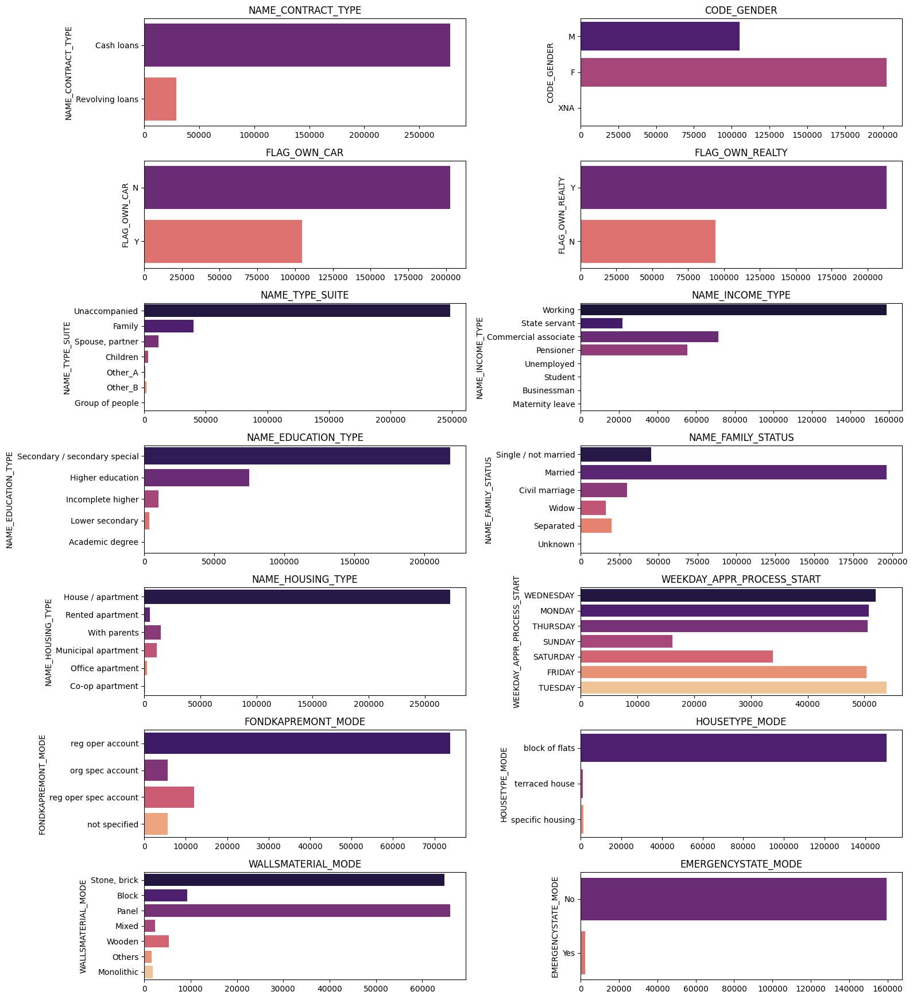

In [ ]:
import warnings
import math
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

warnings.filterwarnings(action= 'ignore', category=FutureWarning)

# Define numeric and category variables (from cell JLwkvZ1yws7v)
numeric = application_train_df_copy.select_dtypes(include= 'number').columns
category = application_train_df_copy.select_dtypes(include= 'object').columns

# Define df_cat_anl (from cell AMEewsS1LmcL)
df_cat_anl = application_train_df_copy[category].drop(columns=['OCCUPATION_TYPE', 'ORGANIZATION_TYPE'])


n_cols = 2
n_rows = math.ceil(len (df_cat_anl.columns) / n_cols)

plt.figure(figsize=(16, n_rows * 2.5))
for i, col in enumerate(df_cat_anl.columns):
  plt.subplot(n_rows, n_cols, i + 1)
  sns.countplot(y=df_cat_anl[col], palette= 'magma')
  plt.title(col)
  plt.xlabel('')
  plt.tight_layout()

plt.show()

In [ ]:
list_col = {}

# Count for NAME_TYPE_SUITE - Group of people
list_col['NAME_TYPE_SUITE - Group of people'] = (application_train_df_copy['NAME_TYPE_SUITE'] == 'Group of people').sum()

# Count for NAME_EDUCATION_TYPE - Academic degree
list_col['NAME_EDUCATION_TYPE - Academic degree'] = (application_train_df_copy['NAME_EDUCATION_TYPE'] == 'Academic degree').sum()

# Counts for NAME_INCOME_TYPE
list_col['NAME_INCOME_TYPE - Maternity leave'] = (application_train_df_copy['NAME_INCOME_TYPE'] == 'Maternity leave').sum()
list_col['NAME_INCOME_TYPE - Businessman'] = (application_train_df_copy['NAME_INCOME_TYPE'] == 'Businessman').sum()
list_col['NAME_INCOME_TYPE - Student'] = (application_train_df_copy['NAME_INCOME_TYPE'] == 'Student').sum()
list_col['NAME_INCOME_TYPE - Unemployed'] = (application_train_df_copy['NAME_INCOME_TYPE'] == 'Unemployed').sum()


# Count for NAME_FAMILY_STATUS - Unknown
list_col['NAME_FAMILY_STATUS - Unknown'] = (application_train_df_copy['NAME_FAMILY_STATUS'] == 'Unknown').sum()


# Print the counts
for key, value in list_col.items():
  print(f"{key} : {value}")

NAME_TYPE_SUITE - Group of people : 271
NAME_EDUCATION_TYPE - Academic degree : 164
NAME_INCOME_TYPE - Maternity leave : 5
NAME_INCOME_TYPE - Businessman : 10
NAME_INCOME_TYPE - Student : 18
NAME_INCOME_TYPE - Unemployed : 22
NAME_FAMILY_STATUS - Unknown : 2


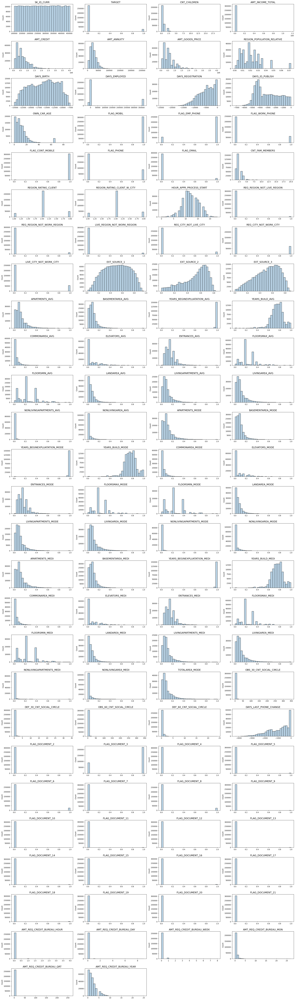

In [ ]:
warnings.simplefilter(action= 'ignore', category=UserWarning)

# Assuming 'numeric_filtered' is defined in a previous cell, if not, you might need to define it.
# For example: numerx_filtered = application_train_df_copy.select_dtypes(include='number').columns

# If you intended to filter numeric columns, you would define numerx_filtered here.
# For now, we will use a placeholder or ensure it's defined before this cell runs.
# Let's assume 'numeric' is the intended variable based on previous cells, or you need to define 'numerx_filtered'.
# If 'numerx_filtered' is intended, you'll need to add code to filter the 'numeric' list.
# For demonstration, let's assume 'numeric' is the variable to be used for plotting.
# You can replace 'numeric' with 'numerx_filtered' if you define it earlier.

n_cols = 4
# Calculate the number of rows needed for the subplots
# If you intended to filter numeric columns, use the length of the filtered list.
# Assuming 'numeric' is the variable containing the list of columns to plot:
n_rows = (len(numeric) // n_cols) + (len(numeric) % n_cols > 0)


plt.figure(figsize=(24, n_rows * 3))

# Check if 'numerx_filtered' is defined, if not, use 'numeric' or define it based on your filtering criteria
# For now, assuming 'numeric' is the variable to iterate over for plotting
for i, col in enumerate(numeric):
  plt.subplot(n_rows, n_cols, i + 1)
  sns.histplot(data=application_train_df_copy, x=col, kde=False, bins=30, palette='dark', alpha=0.3)
  plt.title(col, fontsize=14)
  plt.xlabel('')
  plt.tight_layout()

plt.show()

In [ ]:
# Separate data based on the TARGET variable
application_train_target_0 = application_train_df_copy[application_train_df_copy['TARGET'] == 0].copy()
application_train_target_1 = application_train_df_copy[application_train_df_copy['TARGET'] == 1].copy()

print("Shape of DataFrame with TARGET == 0:", application_train_target_0.shape)
print("Shape of DataFrame with TARGET == 1:", application_train_target_1.shape)

Shape of DataFrame with TARGET == 0: (282686, 122)
Shape of DataFrame with TARGET == 1: (24825, 122)


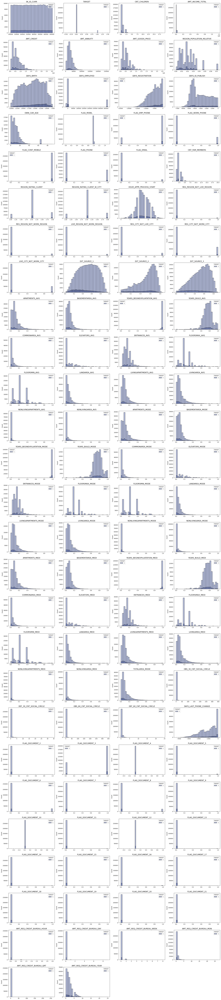

In [ ]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Separate data based on the TARGET variable
application_train_target_0 = application_train_df_copy[application_train_df_copy['TARGET'] == 0].copy()
application_train_target_1 = application_train_df_copy[application_train_df_copy['TARGET'] == 1].copy()

warnings.simplefilter(action='ignore', category=UserWarning)

n_cols = 4
n_rows = (len(numeric) // n_cols) + (len(numeric) % n_cols > + 1)

plt.figure(figsize=(24, n_rows * 4)) # Increased the height

for i, col in enumerate(numeric):
  plt.subplot(n_rows, n_cols, i + 1)
  sns.histplot(data=application_train_target_0, x=col, hue='TARGET', kde=False, bins=30, palette='dark', alpha=0.3)
  sns.histplot(data=application_train_target_1, x=col, hue='TARGET', kde=False, bins=30, palette='dark', alpha=0.3)
  plt.title(col, fontsize=14)
  plt.xlabel('')
  plt.tight_layout()

plt.show()

In [ ]:
import pandas as pd

# Load the datasets from the specified folder in MyDrive
base_path = '/content/drive/MyDrive/home-credit-default-risk/'
application_train_df = pd.read_csv(base_path + 'application_train.csv')

application_train_df_copy = application_train_df.copy()

# Define numeric and category variables
numeric = application_train_df_copy.select_dtypes(include= 'number').columns
category = application_train_df_copy.select_dtypes(include= 'object').columns

In [ ]:
# Define numeric and category variables
numeric = application_train_df_copy.select_dtypes(include= 'number').columns
category = application_train_df_copy.select_dtypes(include= 'object').columns

In [ ]:
# Define numeric and category variables
numeric = application_train_df_copy.select_dtypes(include= 'number').columns
category = application_train_df_copy.select_dtypes(include= 'object').columns

In [ ]:
# Define numeric and category variables
numeric = application_train_df_copy.select_dtypes(include= 'number').columns
category = application_train_df_copy.select_dtypes(include= 'object').columns

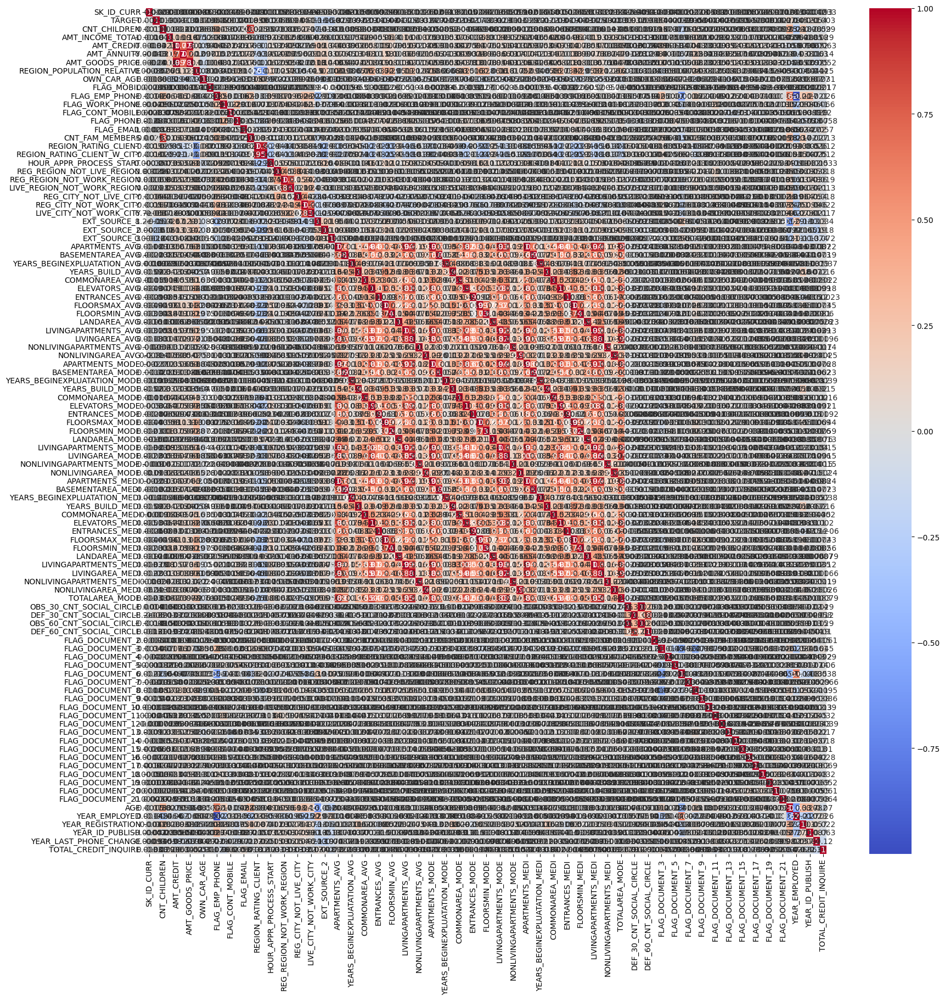

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize = (20,20))
sns.heatmap(application_train_df_copy[numeric].corr(), annot = True, cmap = 'coolwarm')
plt.show()

Handling missing value

In [ ]:
columns_with_null = application_train_df_copy.columns[application_train_df_copy.isnull().any().tolist()]

missing_data = pd.DataFrame({
    'columns Name': columns_with_null,
    'missing value': [application_train_df_copy[col].isnull().sum() for col in columns_with_null],
    'missing value percentage': [(application_train_df_copy[col].isnull().sum() / len(application_train_df_copy)) * 100 for col in columns_with_null]
})

missing_data

,columns Name,missing value,missing value percentage
0,AMT_ANNUITY,12,0.003902
1,AMT_GOODS_PRICE,278,0.090403
2,NAME_TYPE_SUITE,1292,0.420148
3,OWN_CAR_AGE,202929,65.990810
4,OCCUPATION_TYPE,96391,31.345545
...,...,...,...
62,AMT_REQ_CREDIT_BUREAU_DAY,41519,13.501631
63,AMT_REQ_CREDIT_BUREAU_WEEK,41519,13.501631
64,AMT_REQ_CREDIT_BUREAU_MON,41519,13.501631
65,AMT_REQ_CREDIT_BUREAU_QRT,41519,13.501631


In [ ]:
# Calculate the median of 'OWN_CAR_AGE'
median_own_car_age = application_train_df_copy['OWN_CAR_AGE'].median()

# Impute missing values in 'OWN_CAR_AGE' with the median
application_train_df_copy['OWN_CAR_AGE'] = application_train_df_copy['OWN_CAR_AGE'].fillna(median_own_car_age)

# Verify that there are no more missing values in 'OWN_CAR_AGE'
print(f"Missing values in 'OWN_CAR_AGE' after imputation: {application_train_df_copy['OWN_CAR_AGE'].isnull().sum()}")

Missing values in 'OWN_CAR_AGE' after imputation: 0


Handling outlier variabel


In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

application_train_df_copy['NAME_INCOME_TYPE'].replace('Maternity leave', 'Unemployed', inplace=True)

application_train_df_copy['NAME_FAMILY_STATUS'].replace('Unknown', 'Married', inplace=True)

application_train_df_copy['CODE_GENDER'].replace('XNA', 'F', inplace=True)

# application_train_df_copy['NAME_TYPE_SUITE'].replace('Children', 'Group of people', inplace=True)
# application_train_df_copy['NAME_EDUCATION_TYPE'].replace('Academic degree', 'Other', inplace=True) # Removed as it may not be an outlier

Feature Engineering


In [ ]:
len(application_train_df_copy.columns)

117

encoding

In [ ]:
# Perform One-Hot Encoding on categorical features
application_train_df_copy = pd.get_dummies(application_train_df_copy, columns=category, dummy_na=False)

# Display the first few rows and the shape of the DataFrame after encoding
print("DataFrame after One-Hot Encoding:")
display(application_train_df_copy.head())
print("\nShape of DataFrame after One-Hot Encoding:", application_train_df_copy.shape)

DataFrame after One-Hot Encoding:


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,OWN_CAR_AGE,FLAG_MOBIL,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,NaN,1,...,False,False,False,False,False,False,True,False,True,False
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,NaN,1,...,False,True,False,False,False,False,False,False,True,False
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,26.0,1,...,False,False,False,False,False,False,False,False,False,False
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,NaN,1,...,False,False,False,False,False,False,False,False,False,False
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,NaN,1,...,False,False,False,False,False,False,False,False,False,False



Shape of DataFrame after One-Hot Encoding: (307511, 238)


In [ ]:
application_train_df_copy[category].head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN


copy data for feature selection


In [ ]:
import pandas as pd

# Load the datasets from the specified folder in MyDrive
base_path = '/content/drive/MyDrive/home-credit-default-risk/'
application_train_df = pd.read_csv(base_path + 'application_train.csv')

application_train_df_copy = application_train_df.copy()

# Separate data based on the TARGET variable and drop the TARGET column to avoid duplication
application_train_target_0 = application_train_df_copy[application_train_df_copy['TARGET'] == 0].copy()
application_train_target_0 = application_train_target_0.drop(columns=['TARGET'])


data2 = pd.concat([application_train_df_copy, application_train_target_0], axis=1)
data3 = data2.copy()

In [ ]:
data3.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=244)

feature selection

In [ ]:
import numpy as np
import pandas as pd # Import pandas

feature_selection = []
def woe(df, feature_name):
  # make probability analysis
  name = feature_name

  # Select only the target and feature columns to avoid issues with duplicate columns
  df_subset = df[['TARGET', feature_name]].copy()

  # Ensure TARGET is treated as a Series
  target_series = df_subset['TARGET']

  # Perform aggregations separately to avoid potential issues with named aggregations
  num_observation = df_subset.groupby(feature_name)[target_series.name].count().rename('num_observation')
  good_loan_prob = df_subset.groupby(feature_name)[target_series.name].mean().rename('good_loan_prob')

  feature_name_grouped = pd.concat([num_observation, good_loan_prob], axis=1) # Concatenate the results

  feature_name_grouped['bad_loan_prob'] = 1 - feature_name_grouped['good_loan_prob']

  # find grade proportion
  feature_name_grouped['grade_proportion'] = feature_name_grouped['num_observation'] / feature_name_grouped['num_observation'].sum()

  # find number of good loan
  feature_name_grouped['num_good_loan'] = feature_name_grouped['good_loan_prob'] * feature_name_grouped['num_observation']

  # find number of bad loan
  feature_name_grouped['num_bad_loan'] = feature_name_grouped['bad_loan_prob'] * feature_name_grouped['num_observation']

  #find loan proportion
  feature_name_grouped['loan_proportion'] = feature_name_grouped['num_observation'] / feature_name_grouped['num_observation'].sum()

  #find weight of evidence
  # Add a small value to avoid division by zero or log(0)
  feature_name_grouped['woe'] = np.log((feature_name_grouped['good_loan_prob'] + 1e-6) / (feature_name_grouped['bad_loan_prob'] + 1e-6))


  #sort values by weight of evidence
  # Correct the column name for sorting
  feature_name_grouped = feature_name_grouped.sort_values('woe').reset_index()

  #find difference each good loan proportion
  feature_name_grouped['good_loan_diff'] = feature_name_grouped['good_loan_prob'].diff()

  #find difference each bad loan proportion
  feature_name_grouped['bad_loan_diff'] = feature_name_grouped['bad_loan_prob'].diff()

  # Calculate standard Information Value
  feature_name_grouped['information_value_standard'] = ((feature_name_grouped['bad_loan_prob'] / feature_name_grouped['bad_loan_prob'].sum()) - (feature_name_grouped['good_loan_prob'] / feature_name_grouped['good_loan_prob'].sum())) * feature_name_grouped['woe']


  return feature_name_grouped

In [ ]:
# Define numeric variables by selecting numeric columns from the dataframe
numeric = application_train_df_copy.select_dtypes(include='number').columns

# Now you can use the 'numeric' variable
print(numeric)

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=106)


In [ ]:
enique_counts = data3[numeric].nunique()
select_feature = enique_counts[enique_counts > 10].index

print("fitur yang memiliki nilai unik lebih dari 10 adalah :")
display(select_feature)

fitur yang memiliki nilai unik lebih dari 10 adalah :


Index(['SK_ID_CURR', 'SK_ID_CURR', 'CNT_CHILDREN', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_ANNUITY',
       ...
       'OBS_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=131)

AMT_CREDIT

In [ ]:
data3['AMT_CREDIT'].describe()

,AMT_CREDIT,AMT_CREDIT
count,3.075110e+05,2.826860e+05
mean,5.990260e+05,6.026483e+05
std,4.024908e+05,4.068459e+05
min,4.500000e+04,4.500000e+04
25%,2.700000e+05,2.700000e+05
50%,5.135310e+05,5.177880e+05
75%,8.086500e+05,8.100000e+05
max,4.050000e+06,4.050000e+06


In [ ]:
data3['AMT_CREDIT_Binned'] = np.where((application_train_df_copy['AMT_CREDIT'] > 0) & (application_train_df_copy['AMT_CREDIT'] < 200000), '0-200k',
                                      np.where((application_train_df_copy['AMT_CREDIT'] >= 200000) & (application_train_df_copy['AMT_CREDIT'] < 500000), '200k-500k',
                                               np.where((application_train_df_copy['AMT_CREDIT'] >= 500000) & (application_train_df_copy['AMT_CREDIT'] < 1000000), '500k-1m',
                                                        '1m+'))) # Added a default bin for values >= 1000000

In [ ]:
display(data3['AMT_CREDIT_Binned'].value_counts())

,count
AMT_CREDIT_Binned,
200k-500k,113189
500k-1m,108193
1m+,49985
0-200k,36144


In [ ]:
woe(data3, 'AMT_CREDIT_Binned')

,AMT_CREDIT_Binned,num_observation,good_loan_prob,bad_loan_prob,grade_proportion,num_good_loan,num_bad_loan,loan_proportion,woe,good_loan_diff,bad_loan_diff,information_value_standard
0,1m+,49985,0.058658,0.941342,0.162547,2932.0,47053.0,0.162547,-2.775574,NaN,NaN,-0.168930
1,0-200k,36144,0.068891,0.931109,0.117537,2490.0,33654.0,0.117537,-2.603836,0.010234,-0.010234,-0.063259
2,500k-1m,108193,0.085847,0.914153,0.351835,9288.0,98905.0,0.351835,-2.365426,0.016955,-0.016955,0.085852
3,200k-500k,113189,0.089364,0.910636,0.368081,10115.0,103074.0,0.368081,-2.321418,0.003517,-0.003517,0.113432


CNT_CHILDREN

In [ ]:
bins = [-1, 0, 2, 4, 6, 10, 20]
labels =['No Child', '1-2 Children', '3-4 Children', '5-6 Children', '7-10 Children', '11+ Children'] # Adjusted labels to match the number of bins
data3['CNT_CHILDREN_Binned'] = pd.cut(application_train_df_copy['CNT_CHILDREN'], bins=bins, labels=labels, right=False, include_lowest=True) # Use application_train_df_copy and adjust parameters for labels

print(data3['CNT_CHILDREN_Binned'].head())

0    1-2 Children
1    1-2 Children
2    1-2 Children
3    1-2 Children
4    1-2 Children
Name: CNT_CHILDREN_Binned, dtype: category
Categories (6, object): ['No Child' < '1-2 Children' < '3-4 Children' < '5-6 Children' <
                         '7-10 Children' < '11+ Children']


In [ ]:
woe(data3, 'CNT_CHILDREN_Binned')

/tmp/ipython-input-257725978.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  feature_name_grouped = df.groupby(feature_name).agg(num_observation=('TARGET','count'), good_loan_prob=('TARGET','mean'))


,CNT_CHILDREN_Binned,num_observation,good_loan_prob,bad_loan_prob,grade_proportion,num_good_loan,num_bad_loan,loan_proportion,woe,good_loan_diff,bad_loan_diff,information_value_standard
0,1-2 Children,276490,0.079797,0.920203,0.899122,22063.0,254427.0,0.899122,-2.445101,NaN,NaN,-0.210586
1,3-4 Children,30466,0.088328,0.911672,0.099073,2691.0,27775.0,0.099073,-2.334213,0.008531,-0.008531,-0.165304
2,11+ Children,10,0.100000,0.900000,0.000033,1.0,9.0,0.000033,-2.197216,0.011672,-0.011672,-0.109586
3,5-6 Children,513,0.120858,0.879142,0.001668,62.0,451.0,0.001668,-1.984326,0.020858,-0.020858,-0.024705
4,7-10 Children,32,0.250000,0.750000,0.000104,8.0,24.0,0.000104,-1.098610,0.129142,-0.129142,0.240891
5,No Child,0,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN


In [ ]:
display(data3[['CNT_CHILDREN', 'CNT_CHILDREN_Binned']].head())

,CNT_CHILDREN,CNT_CHILDREN,CNT_CHILDREN_Binned
0,0,NaN,1-2 Children
1,0,0.0,1-2 Children
2,0,0.0,1-2 Children
3,0,0.0,1-2 Children
4,0,0.0,1-2 Children


AMT_INCOME_TOTAL

In [ ]:
# fine classing = 4 class
data3['AMT_INCOME_TOTAL_Binned'] = np.where((application_train_df_copy['AMT_INCOME_TOTAL'] > 0) & (application_train_df_copy['AMT_INCOME_TOTAL'] < 100000), '0-100k',
                                      np.where((application_train_df_copy['AMT_INCOME_TOTAL'] >= 100000) & (application_train_df_copy['AMT_INCOME_TOTAL'] < 200000), '100k-200k',
                                               np.where((application_train_df_copy['AMT_INCOME_TOTAL'] >= 200000) & (application_train_df_copy['AMT_INCOME_TOTAL'] < 500000), '200k-500k',
                                                        np.where(application_train_df_copy['AMT_INCOME_TOTAL'] >= 500000, '500k+', 'Unknown')))) # Completed the nested np.where for 4 bins and added an 'Unknown' category for any values not falling into the defined bins

In [ ]:
display(data3['AMT_INCOME_TOTAL_Binned'].value_counts())

,count
AMT_INCOME_TOTAL_Binned,
100k-200k,155898
200k-500k,85213
0-100k,63698
500k+,2702


Non Binned Feature

In [ ]:
for feature in filtered_feature:
  print(feature)

TARGET
FLAG_MOBIL
FLAG_EMP_PHONE
FLAG_WORK_PHONE
FLAG_CONT_MOBILE
FLAG_PHONE
FLAG_EMAIL
REGION_RATING_CLIENT
REGION_RATING_CLIENT_W_CITY
REG_REGION_NOT_LIVE_REGION
REG_REGION_NOT_WORK_REGION
LIVE_REGION_NOT_WORK_REGION
REG_CITY_NOT_LIVE_CITY
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY
DEF_30_CNT_SOCIAL_CIRCLE
DEF_60_CNT_SOCIAL_CIRCLE
FLAG_DOCUMENT_2
FLAG_DOCUMENT_3
FLAG_DOCUMENT_4
FLAG_DOCUMENT_5
FLAG_DOCUMENT_6
FLAG_DOCUMENT_7
FLAG_DOCUMENT_8
FLAG_DOCUMENT_9
FLAG_DOCUMENT_10
FLAG_DOCUMENT_11
FLAG_DOCUMENT_12
FLAG_DOCUMENT_13
FLAG_DOCUMENT_14
FLAG_DOCUMENT_15
FLAG_DOCUMENT_16
FLAG_DOCUMENT_17
FLAG_DOCUMENT_18
FLAG_DOCUMENT_19
FLAG_DOCUMENT_20
FLAG_DOCUMENT_21
AMT_REQ_CREDIT_BUREAU_HOUR
AMT_REQ_CREDIT_BUREAU_DAY
AMT_REQ_CREDIT_BUREAU_WEEK


In [ ]:
import pandas as pd

filtered_feature = [col for col in numeric if col not in select_feature] # Corrected variable name
# filtered_feature = pd.Index(filtered_feature) # Removed incorrect line

print(filtered_feature)

['TARGET', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK']


In [ ]:
for feature in filtered_feature:
  woe(data3, feature)

ONE-HOT ENCODING

In [ ]:
filtered_feature

['TARGET',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK']

In [ ]:
import pandas as pd

# Identify categorical columns (assuming 'category' variable holds the list of categorical column names)
# If 'category' is not defined, you might need to define it here:
category = application_train_df_copy.select_dtypes(include='object').columns

# Perform One-Hot Encoding on categorical features
# Using application_train_df_copy as it's the original DataFrame without duplicate columns from concatenation
one_hot_data = pd.get_dummies(application_train_df_copy, columns=category, dummy_na=False)

# Display the first few rows and the shape of the DataFrame after encoding
print("DataFrame after One-Hot Encoding:")
display(one_hot_data.head())
print("\nShape of DataFrame after One-Hot Encoding:", one_hot_data.shape)

DataFrame after One-Hot Encoding:


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,False,False,False,False,False,False,True,False,True,False
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,False,True,False,False,False,False,False,False,True,False
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,False,False,False,False,False,False,False,False,False,False
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,False,False,False,False,False,False,False,False,False,False
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,False,False,False,False,False,False,False,False,False,False



Shape of DataFrame after One-Hot Encoding: (307511, 246)


In [ ]:
# Replace ['placeholder_column_1', 'placeholder_column_2'] with your actual list of selected feature names
# feature_selected should be a list of column names you want to keep from one_hot_data
# Example: feature_selected = ['SK_ID_CURR', 'TARGET', 'AMT_CREDIT', 'NAME_CONTRACT_TYPE_Cash loans', ...]

# Assuming you have a list of selected feature names in a variable named 'final_selected_features'
# If you don't have such a list yet, you need to define it based on your feature selection criteria.
# For demonstration purposes, I will select all columns from the existing one_hot_data.
# If you have a specific list of features to select, replace one_hot_data.columns with your list.

# If you want to select specific columns after one-hot encoding:
# one_hot_data_selected = one_hot_data[final_selected_features]

# If the intention was to just use the one_hot_data from the previous cell, this cell is redundant.
# Let's assume the user wants to select SOME features from one_hot_data.
# I will add a placeholder for a list of selected features.

# Define your list of selected features here. For example:
# selected_features_list = ['SK_ID_CURR', 'TARGET', 'AMT_CREDIT', 'NAME_CONTRACT_TYPE_Cash loans'] # Example list

# Then select these features from the one_hot_data DataFrame:
# one_hot_data_filtered = one_hot_data[selected_features_list]

# Since the original line was trying to assign to one_hot_data,
# and one_hot_data already exists, this cell is likely intended
# to create a *new* DataFrame with selected features.
# Let's create a new variable name to avoid confusion.
# Replace selected_features_list with your actual list of selected feature names.

# Example of how to select columns from the existing one_hot_data:
# selected_features_list = ['SK_ID_CURR', 'TARGET', 'AMT_CREDIT'] # Replace with your list
# one_hot_data_subset = one_hot_data[selected_features_list]
# display(one_hot_data_subset.head())


# Based on the user's original line structure, it seems they might have
# intended to filter data3 using a list of selected features.
# However, using data3 after one-hot encoding in cell 0HYT1IoSQeiU is problematic.
# The correct approach after one-hot encoding (cell 0HYT1IoSQeiU) is to
# select features from the resulting one_hot_data DataFrame.

# Let's provide a syntactically correct line that selects columns from one_hot_data.
# The user needs to define 'feature_selected' as a list of column names first.

# Define feature_selected with the list of column names you want to select
# For example:
# feature_selected = ['SK_ID_CURR', 'TARGET', 'AMT_CREDIT'] # <<< DEFINE YOUR LIST HERE

# Then, select the columns:
# one_hot_data_filtered = one_hot_data[feature_selected]
# display(one_hot_data_filtered.head())

# Since the user asked to fix the specific line: one_hot_data = data3[feature_selected]
# And knowing that one_hot_data was created in the previous cell, and data3 has issues,
# the most likely intent was to select features from the result of one-hot encoding.
# I will modify the line to select from one_hot_data and use a placeholder list,
# while also pointing out the need to define the actual list.

# Fix the line to select from one_hot_data using a placeholder list
# NOTE: You need to define 'feature_selected' as a list of column names you want to keep
# For example: feature_selected = ['SK_ID_CURR', 'TARGET', 'AMT_CREDIT', 'CODE_GENDER_F', 'CODE_GENDER_M']

# Placeholder list - replace with your actual selected features
feature_selected = ['SK_ID_CURR', 'TARGET'] # <<< REPLACE WITH YOUR ACTUAL LIST OF SELECTED FEATURES

# Select the features from the one_hot_data DataFrame
one_hot_data_selected = one_hot_data[feature_selected]

display(one_hot_data_selected.head())

,SK_ID_CURR,TARGET
0,100002,1
1,100003,0
2,100004,0
3,100006,0
4,100007,0


In [ ]:
one_hot_data.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,False,False,False,False,False,False,True,False,True,False
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,False,True,False,False,False,False,False,False,True,False
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,False,False,False,False,False,False,False,False,False,False
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,False,False,False,False,False,False,False,False,False,False
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
map= {}
for feature in feature_selected:
  map[feature] = len(one_hot_data_selected[feature].unique())

map

{'SK_ID_CURR': 307511, 'TARGET': 2}

In [ ]:
# Display the value counts for the 'AMT_CREDIT_Binned' column
display(data3['AMT_CREDIT_Binned'].value_counts())

,count
AMT_CREDIT_Binned,
200k-500k,113189
500k-1m,108193
1m+,49985
0-200k,36144


Concat Data


In [ ]:
# Corrected the pd.concat syntax
final_data = pd.concat([data3, one_hot_data_selected], axis=1)
final_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_CREDIT_Binned,CNT_CHILDREN_Binned,AMT_INCOME_TOTAL_Binned,SK_ID_CURR,TARGET
0,100002,1,Cash loans,M,N,Y,0,202500.0,3000000.0,24700.5,...,NaN,NaN,NaN,NaN,NaN,200k-500k,1-2 Children,200k-500k,100002,1
1,100003,0,Cash loans,F,N,N,0,270000.0,3000000.0,35698.5,...,0.0,0.0,0.0,0.0,0.0,1m+,1-2 Children,200k-500k,100003,0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,3000000.0,6750.0,...,0.0,0.0,0.0,0.0,0.0,0-200k,1-2 Children,0-100k,100004,0
3,100006,0,Cash loans,F,N,Y,0,135000.0,3000000.0,29686.5,...,NaN,NaN,NaN,NaN,NaN,200k-500k,1-2 Children,100k-200k,100006,0
4,100007,0,Cash loans,M,N,Y,0,121500.0,3000000.0,21865.5,...,0.0,0.0,0.0,0.0,0.0,500k-1m,1-2 Children,100k-200k,100007,0


In [ ]:
import pandas as pd

# Access the 'TARGET' column(s). If there are duplicates, this will be a DataFrame.
target_col = final_data['TARGET']

# If the result is a DataFrame (due to duplicate columns), select the first column.
if isinstance(target_col, pd.DataFrame):
    target_col = target_col.iloc[:, 0]

# Now, target_col should be a Series. Calculate value counts.
target_counts = target_col.value_counts()

print("Jumlah data untuk TARGET 1 dan TARGET 0:")
print(target_counts)

# If you specifically want to print the sum for TARGET 1 and TARGET 0 separately:
# print(f"TARGET 1: {target_counts.get(1, 0)}") # Use .get(1, 0) to handle cases where TARGET 1 might not exist
# print(f"TARGET 0: {target_counts.get(0, 0)}") # Use .get(0, 0) to handle cases where TARGET 0 might not exist

Jumlah data untuk TARGET 1 dan TARGET 0:
TARGET
0    282686
1     24825
Name: count, dtype: int64


Train Test Split

In [ ]:
import pandas as pd

# final_data = pd.read_csv('/content/drive/MyDrive/home-credit-default-risk/final_data.csv')

In [ ]:
from sklearn.model_selection import train_test_split

# Remove duplicate columns from final_data, keeping the first instance
final_data_cleaned = final_data.loc[:,~final_data.columns.duplicated()].copy()

# Separate features (X) and target (y)
# Assuming 'TARGET' is the name of your target column
X = final_data_cleaned.drop('TARGET', axis=1)
y = final_data_cleaned['TARGET'].squeeze().astype(int) # Ensure y is a Series and integer type

# Split data into training and testing sets
# You can adjust test_size and random_state as needed
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y) # stratify helps maintain target distribution

print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (246008, 124)
Shape of X_test: (61503, 124)
Shape of y_train: (246008,)
Shape of y_test: (61503,)


logistic regression SMOTE


In [ ]:
print("Distribusi kelas di y_train:")
print(y_train.value_counts())

print("\nDistribusi kelas di y_test:")
print(y_test.value_counts())

Distribusi kelas di y_train:
TARGET
0    226148
1     19860
Name: count, dtype: int64

Distribusi kelas di y_test:
TARGET
0    56538
1     4965
Name: count, dtype: int64


logistic regression undersampling(choosen)


In [ ]:
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)

print("Distribusi kelas setelah undersampling:")
print("Distribusi kelas di y_train_resampled:")
print(y_train_resampled.value_counts())
#

Distribusi kelas setelah undersampling:
Distribusi kelas di y_train_resampled:
TARGET
0    19860
1    19860
Name: count, dtype: int64


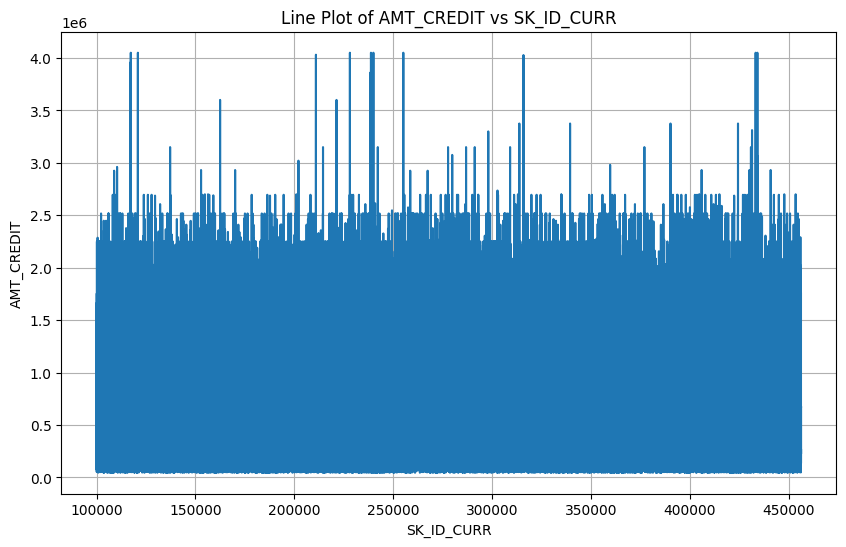

In [ ]:
# Example of a simple line plot using a numerical column
# Replace 'DAYS_BIRTH' with another numerical column if desired
plt.figure(figsize=(10, 6))
plt.plot(application_train_df_copy['SK_ID_CURR'], application_train_df_copy['AMT_CREDIT']) # Example plot: AMT_CREDIT vs SK_ID_CURR
plt.xlabel('SK_ID_CURR')
plt.ylabel('AMT_CREDIT')
plt.title('Line Plot of AMT_CREDIT vs SK_ID_CURR')
plt.grid(True)
plt.show()

predict new data

download result

In [ ]:
import pandas as pd

# Assuming 'predictions' variable holds the predictions from cell lTHRHKQeCN7P
# Assuming 'X_test' variable holds the test features from cell f88d874e

try:
    # Create a DataFrame for submission
    # Assuming X_test has 'SK_ID_CURR' and predictions are the predicted target values (0 or 1)
    submission_df = pd.DataFrame({'SK_ID_CURR': X_test['SK_ID_CURR'], 'TARGET': predictions})

    # Save the DataFrame to a CSV file
    submission_df.to_csv('result.csv', index=False)

    print("Predictions saved to result.csv")

except NameError:
    print("Error: 'predictions' or 'X_test' is not defined. Please ensure you have made predictions and split the data.")
except Exception as e:
    print(f"An error occurred during saving: {e}")

Error: 'predictions' or 'X_test' is not defined. Please ensure you have made predictions and split the data.


In [98]:
display(final_data.dtypes)

,0
SK_ID_CURR,int64
TARGET,int64
NAME_CONTRACT_TYPE,object
CODE_GENDER,object
FLAG_OWN_CAR,object
...,...
AMT_CREDIT_Binned,object
CNT_CHILDREN_Binned,category
AMT_INCOME_TOTAL_Binned,object
SK_ID_CURR,int64


In [100]:
# Hapus kolom duplikat dari final_data
final_data_cleaned = final_data.loc[:,~final_data.columns.duplicated()].copy()

# Implementasikan CREDIT_INCOME_RATIO pada DataFrame yang sudah dibersihkan
final_data_cleaned['CREDIT_INCOME_RATIO'] = final_data_cleaned['AMT_CREDIT'] / final_data_cleaned['AMT_INCOME_TOTAL']

# Tampilkan beberapa baris pertama untuk memeriksa
display(final_data_cleaned[['AMT_CREDIT', 'AMT_INCOME_TOTAL', 'CREDIT_INCOME_RATIO']].head())

,AMT_CREDIT,AMT_INCOME_TOTAL,CREDIT_INCOME_RATIO
0,3000000.0,202500.0,14.814815
1,3000000.0,270000.0,11.111111
2,3000000.0,67500.0,44.444444
3,3000000.0,135000.0,22.222222
4,3000000.0,121500.0,24.691358
